# A Toy Model of Superposition

Theory: there are high level 'features' $x_i$ that the network learns about data. These are high-dimensional, and are encoded into neural networks in a low-dimensional manner through neurons. The thought is that all features $x_i$ can be represented in a sparse activation vector $x$. The sparsity of these features come from the intuitive fact that not every feature in real life would be represented for any token. We represent the projection of a feature $x$ to the neuron basis as $h = Wx$. 

Consider that $W \in \mathbb{R}^{n\times m}$ is a short, wide matrix. Here, $m$ is the (large) dimension of the feature space, and $n$ is the (comparatively small) dimension of the neuron space. Each row $W = [w_1^\top, \ldots, w_m^\top]^\top, w_i\in\mathbb{R^n}$ is a direction in the neuron basis corresponding to a specific feature.

# Data Creation

From Toy Models of Superposition: 
> The input vectors x are synthetic data intended to simulate the properties we believe the true underlying features of our task have. We consider each dimension $x_i$ to be a "feature". Each one has an associated sparsity $S_i$ and importance $I_i$. We let $x_i=0$ with probability $S_i$, but is otherwise uniformly distributed between $[0,1]$.The choice to have features distributed uniformly is arbitrary. An exponential or power law distribution would also be very natural. In practice, we focus on the case where all features have the same sparsity, $S_i = S$.

In [140]:
import torch
import matplotlib.pyplot as plt
import numpy as np
from dataclasses import dataclass
import os

os.environ["CUBLAS_WORKSPACE_CONFIG"] = ":4096:8"   # for CUDA ≥11

@dataclass
class Config:
  tied: int
  linear: bool = True

config = Config(tied=1)

def create_data_sample(num_samples, batch_size, feature_dim, sparsities, distribution="uniform", device="cuda"):
    """
    Creates a sample of data with given parameters.
    
    Args:
        feature_dim (int): The number of features in x_i.
        batch_size (int): The number of samples in the batch.
        num_samples (int): The number of samples to generate, ie [num_samples, batch_size, feature_dim].
        sparsity (float): The fraction of non-zero elements in the data.
        distribution (str): The distribution to use for generating data. Currently only accepts 'uniform'.

    Returns:
        torch.Tensor: A tensor containing the generated data sample.
    """
    if distribution == "uniform":
        data = torch.rand((num_samples, batch_size, feature_dim), device=device).float()
    else:
        raise ValueError("Unsupported distribution type. Use 'uniform' or 'normal'.")
    
    # Apply sparsity
    mask = torch.rand(data.shape, device="cuda") < sparsities.view(-1, 1, 1)
    data[mask] = 0
    
    return data

In [141]:
from torch import nn
import einops
from einops import rearrange, reduce, repeat

class ToyModel(nn.Module):
    def __init__(self, num_models, feature_dim, neuron_dim, linear = False, tied = True, device="cuda"):
        super(ToyModel, self).__init__()
        
        # Linearly encode features without a bias
        self.W = nn.Parameter(torch.empty((feature_dim, neuron_dim), device=device))
        nn.init.xavier_normal_(self.W)
        self.bias_final = nn.Parameter(torch.zeros(feature_dim, device=device))

        self.neuron_dim = neuron_dim
        self.feature_dim = feature_dim
        self.linear = linear
        self.tied = tied
        self.num_models = num_models

        assert(tied == True)
        
    def forward(self, x):
        """
        x shape: (num_models, batch_size, feature_dim)
        returns: (num_models, batch_size, feature_dim)
        """
        
        # Encode the input
        encoded = torch.matmul(x, self.W)
        
        if self.tied:
            # Note: W is stored as W^T in the encoder
            decoded = torch.matmul(encoded, self.W.T)
            decoded += self.bias_final
        
        if not self.linear:
            # Apply a linear activation function
            decoded = torch.relu(decoded)

        return decoded


In [142]:
from torch import nn
import einops

class ToyModel(nn.Module):
    def __init__(self, num_models, feature_dim, neuron_dim, linear = False, tied = True, device="cuda"):
        super(ToyModel, self).__init__()
        
        # Linearly encode features without a bias
        self.W = nn.Parameter(torch.empty((num_models, feature_dim, neuron_dim), device=device))
        nn.init.xavier_normal_(self.W)
        self.bias_final = nn.Parameter(torch.zeros(num_models, feature_dim, device=device))

        self.neuron_dim = neuron_dim
        self.feature_dim = feature_dim
        self.linear = linear
        self.tied = tied
        self.num_models = num_models

        assert(tied == True)
        
    def forward(self, x):
        """
        x shape: (num_models, batch_size, feature_dim)
        returns: (num_models, batch_size, feature_dim)
        """
        
        # Encode the input
        # [num_models, batch_size, feature_dim] x [num_models, feature_dim, neuron_dim] -> [num_models, batch_size, neuron_dim]
        encoded = torch.einsum('mbf,mfn->mbn', x, self.W)
        
        if self.tied:
            # Note: W is stored as W^T in the encoder
            # [num_models, batch_size, neuron_dim] x [num_models, neuron_dim, feature_dim] -> [num_models, batch_size, feature_dim]
            decoded = torch.einsum('mbn,mnf->mbf', encoded, self.W.transpose(1,2))

            decoded += self.bias_final.unsqueeze(1)  # Add bias across batch dimension
        
        if not self.linear:
            # Apply a linear activation function
            decoded = torch.relu(decoded)

        return decoded


Beginning with feature dim=20; neuron dim = 5; $I_i=0.7^i$

In [165]:
def loss_with_importance(x, xhat, importances):
    """
    Computes the loss with importance weighting.
    
    Args:
        x (torch.Tensor): The original input data. shape [num_models, batch_size, feature_dim]
        xhat (torch.Tensor): The reconstructed data.
        importances (torch.Tensor): The importance weights for each feature. shape [num_models, feature_dim]
    
    Returns:
        torch.Tensor: The computed loss.
    """
    # Compute the loss
    loss = torch.mean(importances.unsqueeze(1) * (x - xhat) ** 2)
    
    return loss

In [169]:
I_i

tensor([[1.0000, 0.7000, 0.4900, 0.3430, 0.2401, 0.1681, 0.1176, 0.0824, 0.0576,
         0.0404, 0.0282, 0.0198, 0.0138, 0.0097, 0.0068, 0.0047, 0.0033, 0.0023,
         0.0016, 0.0011],
        [1.0000, 0.7000, 0.4900, 0.3430, 0.2401, 0.1681, 0.1176, 0.0824, 0.0576,
         0.0404, 0.0282, 0.0198, 0.0138, 0.0097, 0.0068, 0.0047, 0.0033, 0.0023,
         0.0016, 0.0011]], device='cuda:0')

In [188]:
from tqdm import tqdm


def train_model(ModelClass, importances, num_models, feature_dim, neuron_dim, batch_size, 
        sparsities, epochs = 10000, device="cuda", validate=False, linear=False, tied=True, lr=0.01, save_weights=False):
    
    toy_model = ModelClass(num_models=num_models, feature_dim=feature_dim, neuron_dim=neuron_dim, linear=config.linear, tied=config.tied, device="cuda")
    # toy_model = ModelClass(feature_dim=feature_dim, neuron_dim=neuron_dim, linear=linear, tied=tied, device=device)
    
    if validate:
        # Validation set
        data_val = create_data_sample(num_samples=num_models, feature_dim=feature_dim, batch_size=batch_size, sparsities=sparsities)
    # Define the optimizer
    optimizer = torch.optim.AdamW(toy_model.parameters(), lr=lr)

    losses = []
    val_losses = []
    weights_saved = []
    for epoch in tqdm(range(epochs)):
        # Create a sample data point
        data = create_data_sample(num_samples=num_models, feature_dim=feature_dim, batch_size=batch_size, sparsities=sparsities)
        # toy_model.zero_grad()
        optimizer.zero_grad()

        # Forward pass through the model
        output = toy_model(data)
        
        # Compute the loss (mean squared error)
        loss = loss_with_importance(data, output, importances)
        
        # Backward pass and optimization
        loss.backward()
        losses.append(loss.item())
        optimizer.step()    

        if validate:
            with torch.no_grad():
                val_output = toy_model(data_val)
                val_loss = loss_with_importance(data_val, val_output, importances)
                # print(f"Validation Loss: {val_loss.item():.4f}")
                # Store the loss for plotting
                val_losses.append(val_loss.item())
        if save_weights:
            weights_saved.append(toy_model.W.detach().cpu().numpy().copy())

    return toy_model, losses, val_losses, weights_saved

In [179]:
from matplotlib.colors import LinearSegmentedColormap

# ────────────────────────────────────────────────────────────────
#  WᵀW / cosine-similarity heat-map with background-at-zero
# ────────────────────────────────────────────────────────────────
def plot_WtW(
    model,
    layer_name : str  = "W",
    cosine     : bool = False,
    zero_eps   : float = 1e-5,       # |value| < zero_eps  →  bg colour
    figsize    : tuple = (3, 3),
    ax         = None,
    title      : str   | None = r"$\cos\theta_{ij}$",
    which_w = 0
):
    # 1 — extract weight matrix
    with torch.no_grad():
        W = getattr(model, layer_name).detach().cpu().numpy()   # (n, m)
        W = W[which_w]  # Select the specific weight matrix for the model
    # 2 — Gram matrix
    G = W @ W.T                                   # (m, m)
    if cosine:
        d = np.sqrt(np.diag(G)) + 1e-12
        G = G / np.outer(d, d)

    # 3 — mask (|G| < zero_eps) so they get background colour
    G_masked = np.ma.masked_where(np.abs(G) < zero_eps, G)

    # 4 — custom diverging colormap:  blue  →  bg  →  red
    #     bg colour comes from the Axes face colour (usually light-grey)
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    bg = ax.get_facecolor()[:3]      # RGBA → RGB

    cmap = LinearSegmentedColormap.from_list(
        "blue-bg-red",
        [
            (0.0, "blue"),   # –1
            (0.5, bg),       #  0
            (1.0, "red"),    # +1
        ],
        N=256,
    )

    # 5 — plot
    im = ax.imshow(
        G_masked,
        origin="lower",
        cmap=cmap,
        vmin=-1,
        vmax=1,
        interpolation="none",
    )
    ax.set_xlabel("Feature  j")
    ax.set_ylabel("Feature  i")
    ax.set_title(title)
    plt.colorbar(im, ax=ax, fraction=0.046, pad=0.04)
    plt.tight_layout()
    return ax

def plot_feature_superposition(
    model,
    layer_name: str   = "W",
    normalize_lengths: bool = True,
    normalize_colors: bool  = True,
    figsize: tuple    = (3, 5),
    title: str | None = "Feature Superposition",
    ax = None,
    which_w = 0
):
    """
    Bars: lengths ∝ ||W_i|| (optionally normalized to [0,1])
    Colors: ∝ S_i = sum_j (x_i · x_j)^2 (optionally normalized to [0,1])
    """
    # 1 — extract W: (n_features, dim)
    with torch.no_grad():
        W = getattr(model, layer_name).detach().cpu().numpy()
        W = W[which_w]  # Select the specific weight matrix for the model
        
    # 2 — compute feature norms and superposition scores
    norms = np.linalg.norm(W, axis=1)             # ||W_i||
    G = W @ W.T                                   # Gram matrix
    S = np.sum(G**2, axis=1)                      # superposition per feature

    # 3 — normalize if requested
    if normalize_lengths:
        norms_plot = (norms - norms.min()) / (np.ptp(norms) + 1e-12)
    else:
        norms_plot = norms

    if normalize_colors:
        S_plot = (S - S.min()) / (np.ptp(S) + 1e-12)
    else:
        S_plot = S

    # 4 — color map black→gold
    cmap = LinearSegmentedColormap.from_list(
        "black-gold",
        [(0.0, "black"), (1.0, "gold")],
        N=256,
    )
    colors = cmap(S_plot)

    # 5 — plot horizontal bars
    if ax is None:
        fig, ax = plt.subplots(figsize=figsize)
    idx = np.arange(len(norms_plot))[::-1]   # reverse for top-down
    ax.barh(idx, norms_plot[idx], color=colors[idx], edgecolor="none")
    ax.set_yticks(idx)
    ax.set_yticklabels([f"{i}" for i in idx])
    ax.invert_yaxis()
    ax.set_xlabel(normalize_lengths
                  and "Normalized ‖W_i‖"
                  or "‖W_i‖")
    ax.set_ylabel("Feature  i")
    if title:
        ax.set_title(title)
    plt.tight_layout()
    return ax


## Replicating the de-orthogonalization of feature representations as feature sparsity increases

The idea here is that, with increasing feature sparsity (and the benefit of a nonlinear activation function), the model is able to represent *more* features than the true dimension representable by its neuron space. This is done by representing features in a "nearly orthogonal" manner.

100%|██████████| 10000/10000 [00:07<00:00, 1281.62it/s]


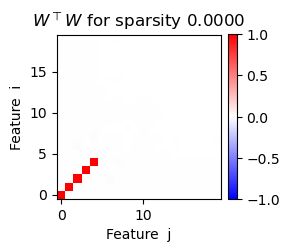

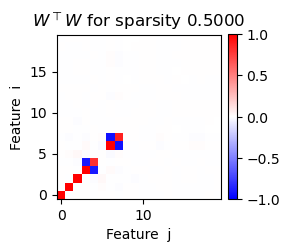

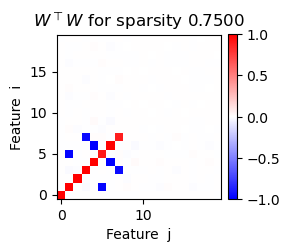

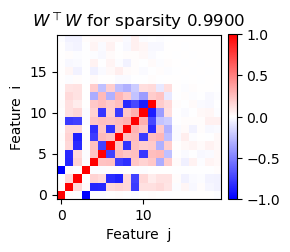

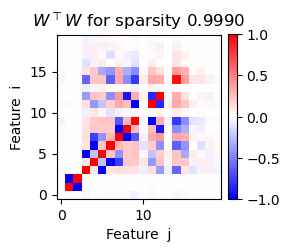

In [191]:
torch.use_deterministic_algorithms(False) # for reproducibility
feature_dim = 20
neuron_dim = 5
config.linear = False

sparsities = torch.tensor([0, 0.5, 0.75, 0.99, 0.999], device="cuda")
num_models = sparsities.shape[0]

importances = torch.tensor(0.75, device="cuda") ** torch.arange(0, feature_dim, device="cuda")
importances = repeat(importances, "f -> b f", b=num_models)

# Train the model
trained = train_model(ToyModel, importances, num_models, validate=False, epochs=10000, sparsities = sparsities, lr=0.01, 
linear=False, feature_dim=feature_dim, neuron_dim=neuron_dim, batch_size=batch_size)

model = trained[0]
for i in range(num_models):
    plot_WtW(model, which_w = i, cosine=False, title=f"$W^\\top W$ for sparsity {sparsities[i].item():.4f}", figsize=(3, 3))
    plt.show()

We see a similar effect when we crank up the feature scale

In [205]:
torch.use_deterministic_algorithms(False) # for reproducibility
feature_dim = 100
neuron_dim = 20
config.linear = False

sparsities = torch.tensor([0, 0.5, 0.75, 0.9, 0.99, 0.999], device="cuda")
num_models = sparsities.shape[0]

importances = torch.tensor(0.95, device="cuda") ** torch.arange(0, feature_dim, device="cuda")
importances = repeat(importances, "f -> b f", b=num_models)

# Train the model
trained = train_model(ToyModel, importances, num_models, validate=False, epochs=10000, sparsities = sparsities, lr=0.01, 
linear=False, feature_dim=feature_dim, neuron_dim=neuron_dim, batch_size=batch_size)

model = trained[0]
# for i in range(num_models):
#     plot_WtW(model, which_w = i, cosine=False, title=f"$W^\\top W$ for sparsity {sparsities[i].item():.4f}", figsize=(3, 3))
#     plt.show()

100%|██████████| 10000/10000 [00:08<00:00, 1219.30it/s]


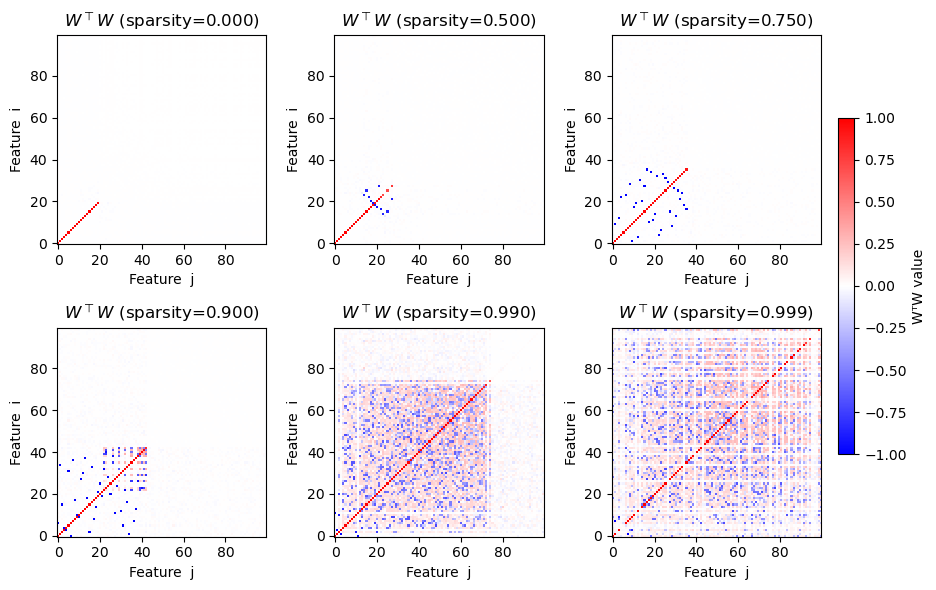

In [206]:
# Layout parameters
n_cols     = 3
n_rows     = (num_models + n_cols - 1) // n_cols
figsize    = (n_cols * 3, n_rows * 3)

# 1) Create the grid of subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
axes_flat = axes.flatten()

# 2) Plot into each subplot, suppressing the internal colorbar
for i in range(num_models):
    ax = axes_flat[i]
    # Temporarily disable the built-in colorbar by monkey-patching plt.colorbar
    # (so it won't appear per-subplot)
    _orig_cb = plt.colorbar
    plt.colorbar = lambda *args, **kwargs: None

    # Call your function
    plot_WtW(
        model,
        which_w=i,
        cosine=False,
        title=f"$W^\\top W$ (sparsity={sparsities[i].item():.3f})",
        ax=ax,         # draw into our grid ax
        figsize=None,  # ignored when ax is supplied
    )

    # Restore the real colorbar
    plt.colorbar = _orig_cb

# 3) Remove unused axes
for j in range(num_models, len(axes_flat)):
    fig.delaxes(axes_flat[j])

# 4) Grab one of the AxesImages to use for the shared colorbar
#    (they all share the same colormap and vmin/vmax)
im = axes_flat[0].images[-1]

# 5) Add a single, global colorbar
cbar = fig.colorbar(im, ax=axes_flat[:num_models], fraction=0.02, pad=0.02)
cbar.set_label("WᵀW value")

# plt.tight_layout()
plt.show()

In [207]:
torch.use_deterministic_algorithms(False) # for reproducibility
feature_dim = 3
neuron_dim = 2

importance = (.5) ** -torch.arange(0, feature_dim, device="cuda")

# sparsities = [0, 0.5, 0.75, 0.99, 0.999]
sparsities = [0.999]

for sparsity in sparsities:
    print(f"Sparsity: {sparsity}")
    # Train the model
    trained = train_model(ToyModel, importance, validate=False, epochs=1000, sparsity = sparsity, lr=0.01, 
    linear=False, feature_dim=feature_dim, neuron_dim=neuron_dim, batch_size=batch_size, save_weights=True)
    model = trained[0]
    weights_saved = trained[-1]
    plot_WtW(model, cosine=False)
    plt.show()
    # plot_feature_superposition(model, normalize_lengths=False, normalize_colors=False)
    # plt.show()

Sparsity: 0.999


TypeError: train_model() got an unexpected keyword argument 'sparsity'

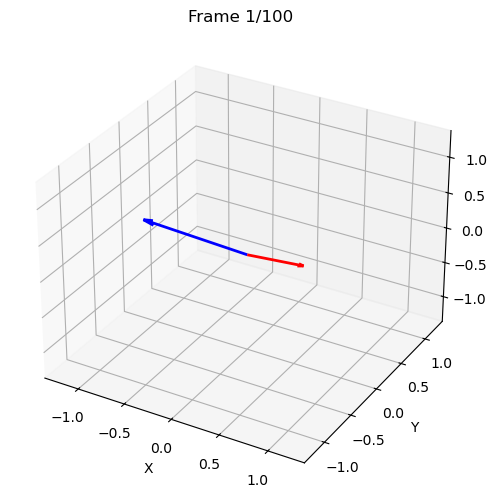

In [76]:
from matplotlib.animation import FuncAnimation
from mpl_toolkits.mplot3d import Axes3D  # noqa: F401
from IPython.display import HTML

# ─────────────────────────────────────────────────────────────────────────────
# Replace this with your real 100×3×2 array:
# data[t, :, 0] is the first 3D vector at time t
# data[t, :, 1] is the second 3D vector at time t
# ─────────────────────────────────────────────────────────────────────────────
data = np.array(weights_saved)

fig = plt.figure(figsize=(6,6))
ax = fig.add_subplot(111, projection='3d')

# Precompute global axis limits so they don’t jump around
lim = np.max(np.abs(data)) * 1.1
ax.set_xlim(-lim, lim)
ax.set_ylim(-lim, lim)
ax.set_zlim(-lim, lim)
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

def update(frame):
    # clear current arrows
    ax.cla()
    # re-set limits & labels (cla() wipes them)
    ax.set_xlim(-lim, lim)
    ax.set_ylim(-lim, lim)
    ax.set_zlim(-lim, lim)
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')

    # extract vectors at this time-step
    v1 = data[frame, :, 0]
    v2 = data[frame, :, 1]

    # plot the two quivers (normalized to their own lengths)
    ax.quiver(0, 0, 0,
              v1[0], v1[1], v1[2],
              length=np.linalg.norm(v1),
              normalize=True,
              color='blue',
              arrow_length_ratio=0.1,
              linewidth=2)

    ax.quiver(0, 0, 0,
              v2[0], v2[1], v2[2],
              length=np.linalg.norm(v2),
              normalize=True,
              color='red',
              arrow_length_ratio=0.1,
              linewidth=2)

    ax.set_title(f"Frame {frame+1}/100")

# build animation
ani = FuncAnimation(
    fig,
    update,
    frames=100,
    interval=100,    # milliseconds between frames
    blit=False,
)

HTML(ani.to_jshtml())


In [77]:
data = data.transpose((0, 2, 1))

fig, ax = plt.subplots(figsize=(5,5))

# compute a global axis limit so things don't jump
lim = np.max(np.abs(data)) * 1.1
ax.set_xlim(-lim, lim)
ax.set_ylim(-lim, lim)
ax.set_aspect('equal', 'box')
ax.grid(True)

# colors and labels for the three vectors
colors = ['red','blue','green']
labels = ['v₁','v₂','v₃']

# initialize three quiver objects (one per vector)
quivers = []
for c, lab in zip(colors, labels):
    q = ax.quiver(0,0, 0,0,
                  color=c,
                  angles='xy',
                  scale_units='xy',
                  scale=1,
                  width=0.005,
                  label=lab)
    quivers.append(q)

ax.legend(loc='upper right')

def update(frame):
    # for each vector k, update the quiver
    for k, q in enumerate(quivers):
        vx, vy = data[frame, :, k]
        # set_offsets doesn't work for quiver, so we replace the segments
        q.set_UVC(vx, vy)
    ax.set_title(f"Frame {frame+1}/100")
    return quivers

ani = FuncAnimation(
    fig, update,
    frames=data.shape[0],
    interval=100,
    blit=True
)

# display inline
HTML(ani.to_jshtml())

## Phase Change Plots

Now, lets sweep over various levels of sparsity and feature importance and create a phase change plot.

We want a grid of mode

In [208]:
sparsities = torch.linspace(0, 0.999, steps=100, device="cuda")